## Model C: Language=All, Angle Rectification=True

download https://paddleocr.bj.bcebos.com/PP-OCRv4/chinese/ch_PP-OCRv4_det_infer.tar to C:\Users\herma/.paddleocr/whl\det\ch\ch_PP-OCRv4_det_infer\ch_PP-OCRv4_det_infer.tar


100%|██████████| 4780/4780 [00:06<00:00, 762.08it/s] 


download https://paddleocr.bj.bcebos.com/PP-OCRv4/chinese/ch_PP-OCRv4_rec_infer.tar to C:\Users\herma/.paddleocr/whl\rec\ch\ch_PP-OCRv4_rec_infer\ch_PP-OCRv4_rec_infer.tar


100%|██████████| 10720/10720 [00:13<00:00, 804.36it/s] 

[2025/05/29 22:47:28] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, use_gcu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='C:\\Users\\herma/.paddleocr/whl\\det\\ch\\ch_PP-OCRv4_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='C:\\Users\\herma/.paddleocr/whl\\rec\\ch\\ch_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320',

[2025/05/29 22:47:28] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.05277371406555176
[2025/05/29 22:47:28] ppocr DEBUG: cls num  : 0, elapsed : 0
[2025/05/29 22:47:28] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
[2025/05/29 22:47:28] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.039046287536621094
[2025/05/29 22:47:29] ppocr DEBUG: cls num  : 1, elapsed : 0.039037466049194336
[2025/05/29 22:47:29] ppocr DEBUG: rec_res num  : 1, elapsed : 0.01901555061340332
[2025/05/29 22:47:29] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.052376508712768555
[2025/05/29 22:47:29] ppocr DEBUG: cls num  : 1, elapsed : 0.0040132999420166016
[2025/05/29 22:47:29] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0095062255859375
[2025/05/29 22:47:29] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.049211740493774414
[2025/05/29 22:47:29] ppocr DEBUG: cls num  : 1, elapsed : 0.00400233268737793
[2025/05/29 22:47:29] ppocr DEBUG: rec_res num  : 1, elapsed : 0.009013652801513672
[2025/05/29 22:47:29] ppocr DEBUG: dt_boxes num 

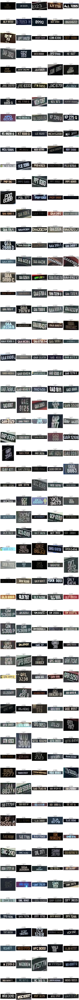

In [6]:
import os
import glob
import math
import matplotlib.pyplot as plt
from paddleocr import PaddleOCR

ocr = PaddleOCR(use_angle_cls=True)

total_imgs = 0
correct_imgs = 0
total_correct_chars = 0
total_chars = 0
records = []

# 1) Run OCR on each image, compute metrics and collect records
for img_path in sorted(glob.glob("v4_data/test/*")):
    if not img_path.lower().endswith((".jpg", ".jpeg", ".png")):
        continue

    total_imgs += 1
    fn = os.path.basename(img_path)
    gt = os.path.splitext(fn)[0].replace(",", "/")

    # OCR
    lines = ocr.ocr(img_path, cls=True) or []

    # collect (x0, text) segments
    segments = []
    for line in lines:
        if not line:
            continue
        for det in line:
            if not det or len(det) < 2:
                continue
            box, (txt, score) = det
            clean = txt.replace(" ", "").replace("\n", "")
            x0 = box[0][0]
            segments.append((x0, clean))

    # reconstruct prediction
    pred = "".join(text for _, text in sorted(segments, key=lambda x: x[0]))

    # exact-match count
    if pred == gt:
        correct_imgs += 1

    # character-level accuracy
    correct_chars = sum(1 for i, c in enumerate(gt) if i < len(pred) and pred[i] == c)
    total_correct_chars += correct_chars
    total_chars += len(gt)

    records.append((fn, gt, pred))

# 2) Print overall metrics
overall = correct_imgs / total_imgs * 100 if total_imgs else 0
char_acc = total_correct_chars / total_chars * 100 if total_chars else 0

print(f"Overall accuracy:         {correct_imgs}/{total_imgs} = {overall:.2f}%")
print(f"Character-level accuracy: {total_correct_chars}/{total_chars} = {char_acc:.2f}%\n")
print("All images:")
# for fn, gt, pred in records:
#     print(f"  {fn} → GT: '{gt}', Pred: '{pred}'")

# 3) Display all images in a grid: 5 columns per row
n = len(records)
cols = 5
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
axes = axes.flatten()

for ax, (fn, gt, pred) in zip(axes, records):
    img = plt.imread(os.path.join("v4_data/test", fn))
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(f"GT: '{gt}'\nPred: '{pred}'", fontsize=10)

# turn off any extra subplots
for ax in axes[n:]:
    ax.axis("off")

plt.tight_layout()
plt.show()